In [1]:
%env CUDA_VISIBLE_DEVICES=0
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow.keras as keras
import imageio
import moviepy.editor as mpy
import time
import pathlib
import random
import IPython.display as display

env: CUDA_VISIBLE_DEVICES=0


In [2]:
batch_size = 100
SAMPLE_COL = 8
SAMPLE_ROW = 8
SAMPLE_NUM = SAMPLE_COL * SAMPLE_ROW
IMG_H = 128
IMG_W = 128
IMG_C = 3
IMG_SHAPE = (IMG_H, IMG_W, IMG_C)
Z_DIM = 128
BUF = 40000
W_EPOCH = 90
BZ = (batch_size, Z_DIM)
#WClipLo = -0.01
#WClipHi = 0.01
IW_LR=1e-4

In [3]:
gpus = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(gpus[0], True)
tf.config.experimental.set_virtual_device_configuration(gpus[0], [tf.config.experimental.VirtualDeviceConfiguration(memory_limit = 10000)])

In [4]:
run_opts = tf.compat.v1.RunOptions(report_tensor_allocations_upon_oom = True)

In [5]:
data_root = pathlib.Path('./C1-P1_Train_A/')
all_image_paths = list(data_root.glob('*'))
all_image_paths = [str(path) for path in all_image_paths]
all_image_paths=sorted(all_image_paths)
image_count = len(all_image_paths)
all_image_paths.pop(0)

'C1-P1_Train_A/.ipynb_checkpoints'

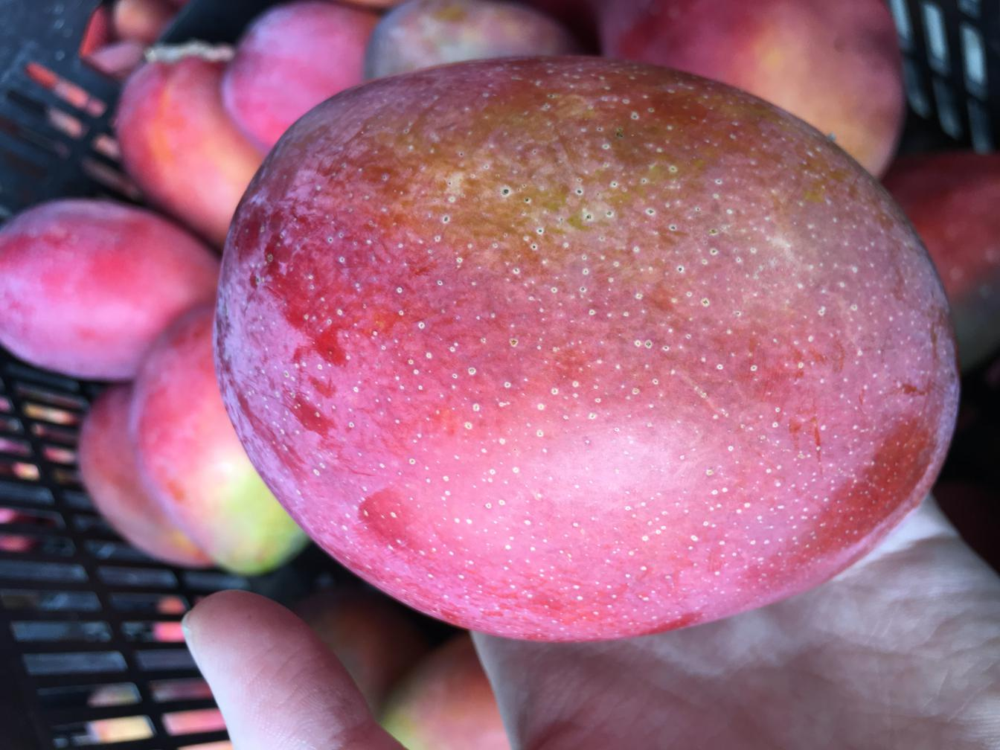

C1-P1_Train_A/01147.jpg


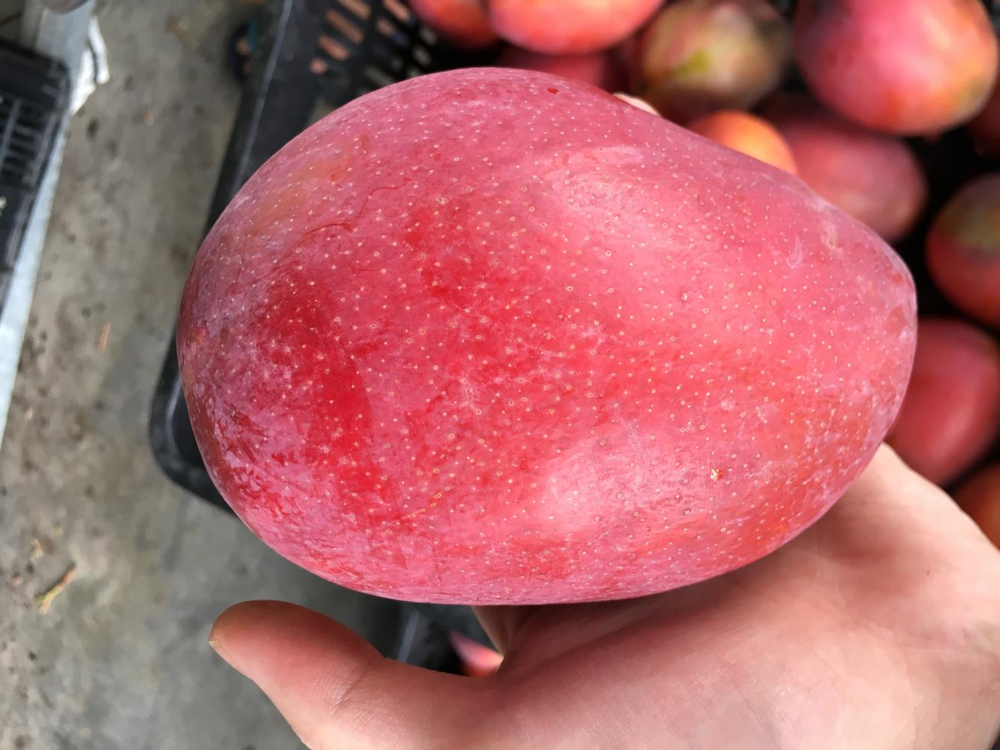

C1-P1_Train_A/05844.jpg


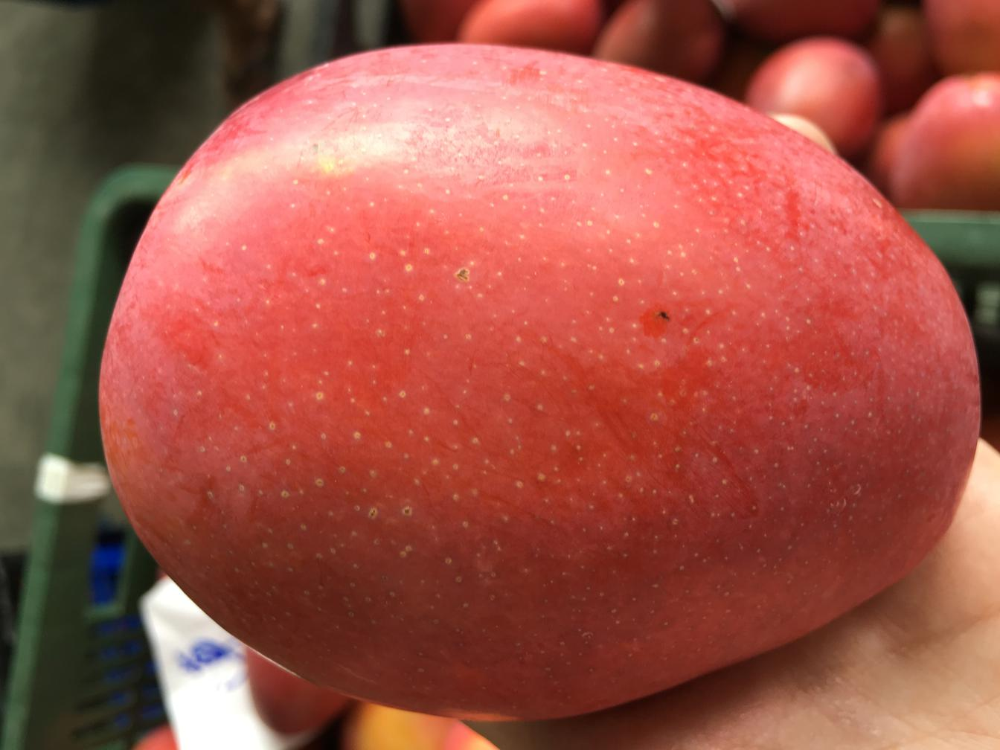

C1-P1_Train_A/04549.jpg


In [6]:
for n in range(3):
    image_path = random.choice(all_image_paths)
    display.display(display.Image(image_path, width=200, height=200))
    print(image_path)

In [7]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_png(img, channels=IMG_C)
    img = tf.image.convert_image_dtype(img, tf.float32)
    img = tf.image.resize(img, (IMG_H, IMG_W))
    return img

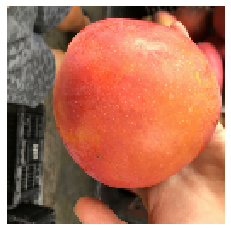

In [8]:
#load_image test
img_test=load_image('C1-P1_Train_A/00504.jpg')
plt.imshow(img_test)
plt.axis("off")
#plt.title("Epoch %d" % ep)
plt.show()

In [9]:
dataset_list = tf.data.Dataset.from_tensor_slices(all_image_paths)
dsTrain = dataset_list.map(load_image).shuffle(BUF).batch(batch_size, True)

In [10]:
dsTrain

<BatchDataset shapes: (100, 128, 128, 3), types: tf.float32>

In [11]:
#(train_images, _), (test_images, _) = tf.keras.datasets.mnist.load_data()

#iTrain = train_images.reshape(-1, 28, 28, 1).astype(np.float32)

# Normalizing the images to the range of [0., 1.]
#iTrain = iTrain / 255.0

#dsTrain = tf.data.Dataset.from_tensor_slices(iTrain).shuffle(BUF).batch(batch_size, True)

 #Utility function
def utPuzzle(imgs, row, col, path = None):
    h, w, c = imgs[0].shape
    out = np.zeros((h * row, w * col, c), np.uint8)
    for n, img in enumerate(imgs):
        j, i = divmod(n, col)
        out[j * h : (j + 1) * h, i * w : (i + 1) * w, :] = img
    if path is not None : imageio.imwrite(path, out)
    return out
  
def utMakeGif(imgs, fname, duration):
    n = float(len(imgs)) / duration
    clip = mpy.VideoClip(lambda t : imgs[int(n * t)], duration = duration)
    clip.write_gif(fname, fps = n)

In [12]:
#DCG, DCD = GAN(IMG_SHAPE, Z_DIM)
sp = IMG_SHAPE
zd = Z_DIM
xh, xw, xc = sp
zh = xh // 4 #28/4
zw = xw // 4


In [13]:
def GAN(sp, zd):
    # Shape
    xh, xw, xc = sp#64,64,1
    zh = xh // 4 #7
    zw = xw // 4 #7
    
    # Model
    return keras.Sequential([
        keras.layers.Dense(units  =  1024, input_shape = (zd,)),
        keras.layers.BatchNormalization(),
        keras.layers.ReLU(),
        keras.layers.Dense(units  =  zh * zw << 8),#7*7*(2**8=256)
        keras.layers.BatchNormalization(),
        keras.layers.ReLU(),
        keras.layers.Reshape(target_shape = (zh, zw, 256)),
        keras.layers.Conv2DTranspose(
            filters = 32,
            kernel_size = 5,
            strides = 2,
            padding = "SAME"
        ),
        keras.layers.BatchNormalization(),
        keras.layers.ReLU(),
        keras.layers.Conv2DTranspose(
            filters = xc,
            kernel_size = 5,
            strides = 2,
            padding = "SAME",
            activation = keras.activations.sigmoid
        ),
    ]), keras.Sequential([
        keras.layers.Conv2D(
            filters = 32,
            kernel_size = 5,
            strides = (2, 2),
            padding = "SAME",
            input_shape = sp,
        ),
        keras.layers.LeakyReLU(),
        #keras.layers.Dropout(0.3),
        keras.layers.Conv2D(
            filters = 128,
            kernel_size = 5,
            strides = (2, 2),
            padding = "SAME"
        ),
        keras.layers.BatchNormalization(),
        keras.layers.LeakyReLU(),
        #keras.layers.Dropout(0.3),
        keras.layers.Flatten(),
        keras.layers.Dense(units  =  1024),
        keras.layers.BatchNormalization(),
        keras.layers.LeakyReLU(),
        keras.layers.Dense(units  =  1),
    ])

s = tf.random.normal([SAMPLE_NUM, Z_DIM])

In [14]:
WG, WD = GAN(IMG_SHAPE, Z_DIM)

In [15]:
WG.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 1024)              132096    
_________________________________________________________________
batch_normalization (BatchNo (None, 1024)              4096      
_________________________________________________________________
re_lu (ReLU)                 (None, 1024)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 262144)            268697600 
_________________________________________________________________
batch_normalization_1 (Batch (None, 262144)            1048576   
_________________________________________________________________
re_lu_1 (ReLU)               (None, 262144)            0         
_________________________________________________________________
reshape (Reshape)            (None, 32, 32, 256)       0

In [16]:
WD.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 64, 64, 32)        2432      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 64, 64, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 32, 128)       102528    
_________________________________________________________________
batch_normalization_3 (Batch (None, 32, 32, 128)       512       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 32, 32, 128)       0         
_________________________________________________________________
flatten (Flatten)            (None, 131072)            0         
_________________________________________________________________
dense_2 (Dense)              (None, 1024)             

In [17]:
opg = keras.optimizers.Adam(learning_rate=IW_LR,beta_1=0.,beta_2=0.9)
opd = keras.optimizers.Adam(learning_rate=IW_LR,beta_1=0.,beta_2=0.9)

In [18]:
@tf.function
def WGTrain(c1):
    z = tf.random.normal(BZ)

    with tf.GradientTape() as tpg:
        c0 = WG(z, training = True)

        z1 = WD(c1, training = True)
        z0 = WD(c0, training = True)

        ld = tf.reduce_mean(z0)
        lg = - ld
        ld = ld - tf.reduce_mean(z1)

    gg = tpg.gradient(lg, WG.trainable_variables)

    opg.apply_gradients(zip(gg, WG.trainable_variables))
    
    return lg, ld

@tf.function
def WDTrain(c1):
    #print(c1.shape)
    z = tf.random.normal(BZ)

    with tf.GradientTape() as tpd:
        c0 = WG(z, training = True)

        z1 = WD(c1, training = True)
        z0 = WD(c0, training = True)

        ld = tf.reduce_mean(z0)
        lg = - ld
        ld = ld - tf.reduce_mean(z1)
                
        epsilon = tf.random.uniform([batch_size, 1, 1, 1], 0., 1.)
        diff = c0-c1
        inter = c1+(epsilon*diff)
        with tf.GradientTape() as t:
            t.watch(inter)
            pred = WD(inter, training=True)
        grad = t.gradient(pred, [inter])[0]
        norm = tf.norm(tf.reshape(grad, [tf.shape(grad)[0], -1]), axis=1)
        gp = tf.reduce_mean((norm-1.) **2)
        
        grad_penalty_weight = 10.0
        ld += grad_penalty_weight*gp

    gd = tpd.gradient(ld, WD.trainable_variables)
    opd.apply_gradients(zip(gd, WD.trainable_variables))
    #for v in WD.trainable_variables : v.assign(tf.clip_by_value(v, WClipLo, WClipHi))
    return lg, ld

WTrain = (
    WDTrain,
    WDTrain,
    WDTrain,
    WDTrain,
    WDTrain,
    WGTrain
)

WCritic = len(WTrain)

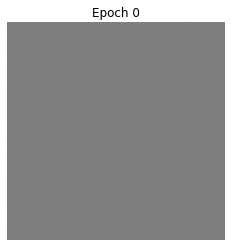

Time taken 37.98843479156494 sec



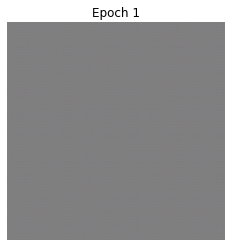

Time taken 29.641714811325073 sec



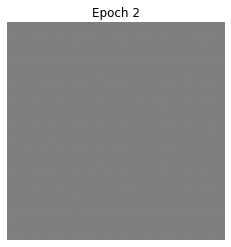

Time taken 29.183254957199097 sec



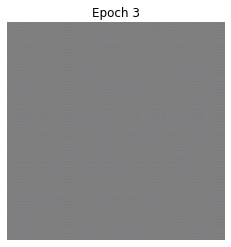

Time taken 29.2984356880188 sec



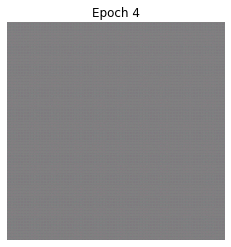

Time taken 28.896491050720215 sec



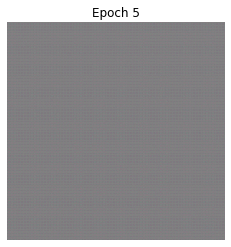

Time taken 28.910329341888428 sec



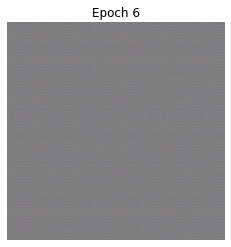

Time taken 29.15239453315735 sec



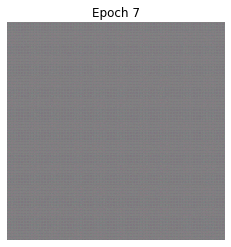

Time taken 28.745543479919434 sec



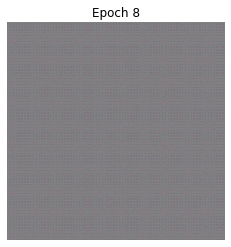

Time taken 28.84424352645874 sec



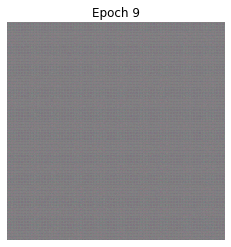

Time taken 28.7911434173584 sec



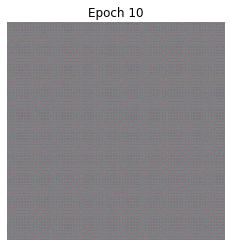

Time taken 28.736482858657837 sec



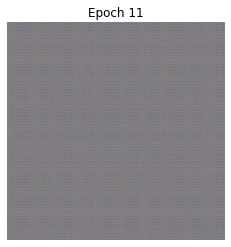

Time taken 28.646573066711426 sec



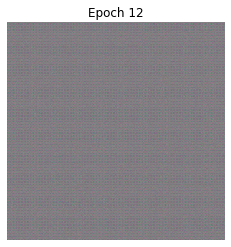

Time taken 29.11294722557068 sec



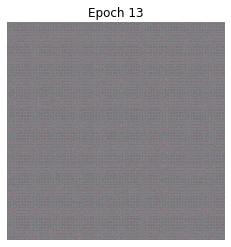

Time taken 28.769569873809814 sec



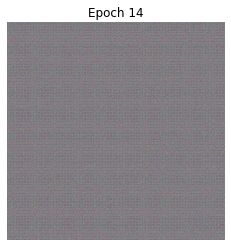

Time taken 28.79495143890381 sec



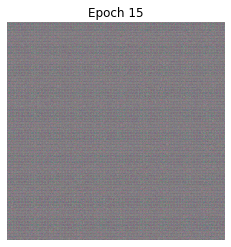

Time taken 28.794706106185913 sec



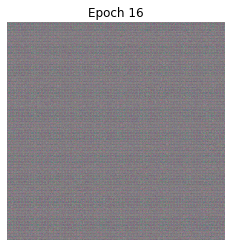

Time taken 28.85511302947998 sec



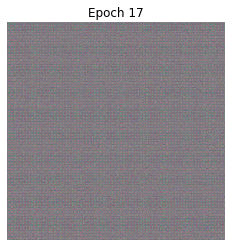

Time taken 28.74472188949585 sec



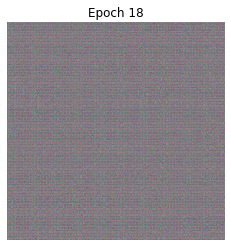

Time taken 29.161899089813232 sec



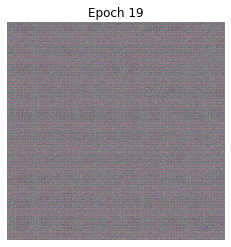

Time taken 28.83304452896118 sec



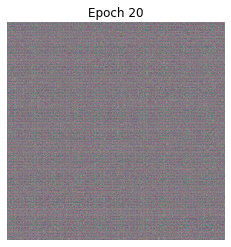

Time taken 28.915031909942627 sec



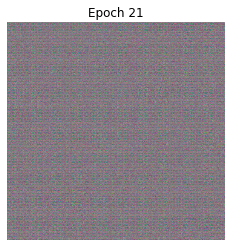

Time taken 28.663182497024536 sec



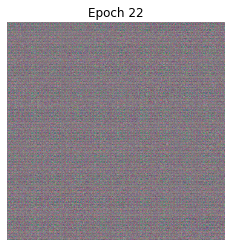

Time taken 29.197574377059937 sec



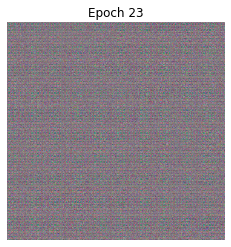

Time taken 28.70231056213379 sec



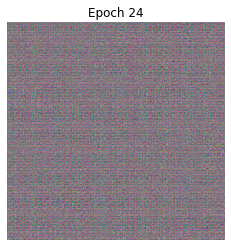

Time taken 29.175257682800293 sec



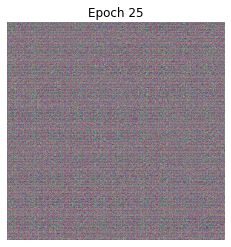

Time taken 28.76227831840515 sec



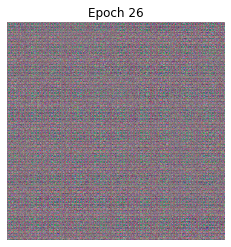

Time taken 28.881871938705444 sec



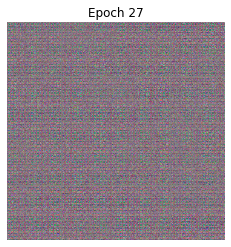

Time taken 28.70344877243042 sec



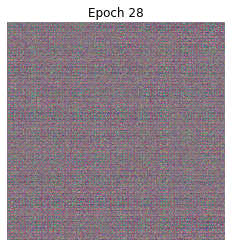

Time taken 29.253180980682373 sec



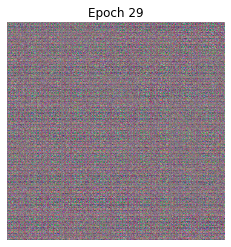

Time taken 28.766419172286987 sec



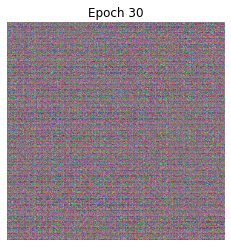

Time taken 29.23200511932373 sec



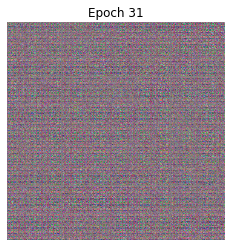

Time taken 28.646821975708008 sec



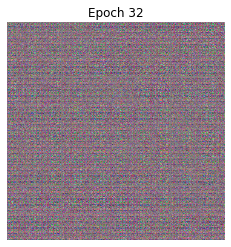

Time taken 28.825455904006958 sec



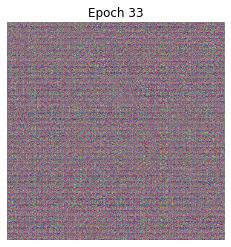

Time taken 28.815526485443115 sec



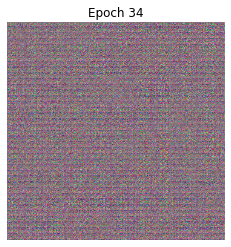

Time taken 28.94468879699707 sec



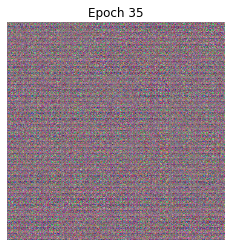

Time taken 28.686930179595947 sec



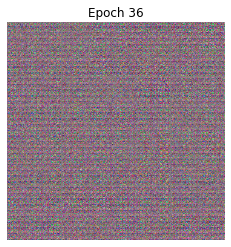

Time taken 29.202943086624146 sec



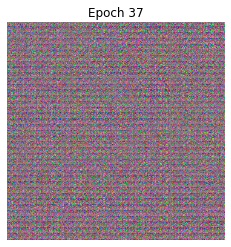

Time taken 28.73469376564026 sec



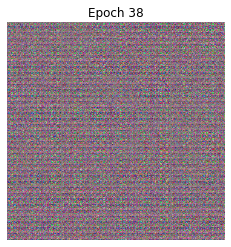

Time taken 28.849265575408936 sec



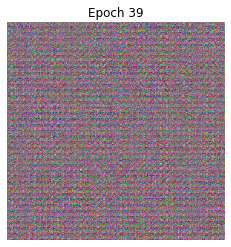

Time taken 28.784753561019897 sec



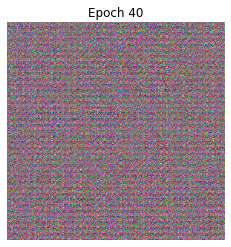

Time taken 28.843039512634277 sec



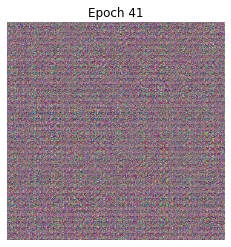

Time taken 28.928284883499146 sec



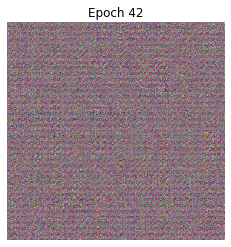

Time taken 29.29036235809326 sec



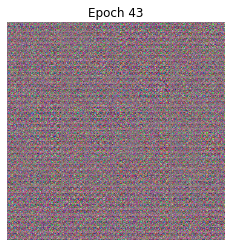

Time taken 28.983974933624268 sec



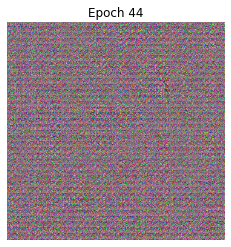

Time taken 29.04849672317505 sec



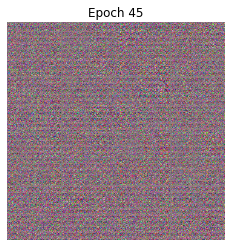

Time taken 28.907848834991455 sec



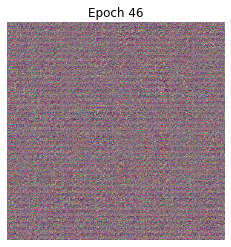

Time taken 29.10315990447998 sec



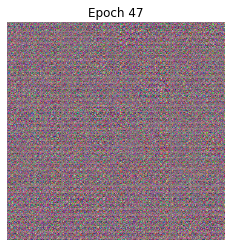

Time taken 29.378429412841797 sec



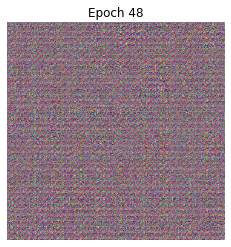

Time taken 29.053977251052856 sec



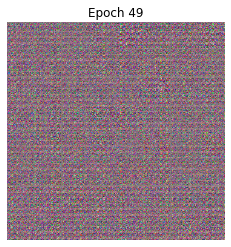

Time taken 28.69077491760254 sec



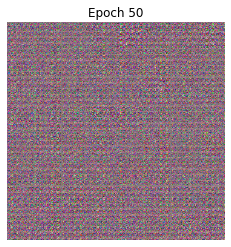

Time taken 28.781436681747437 sec



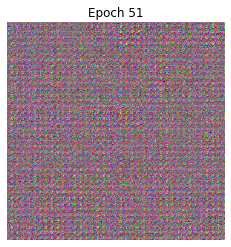

Time taken 29.07985758781433 sec



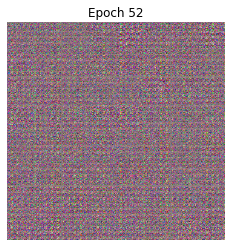

Time taken 29.201554775238037 sec



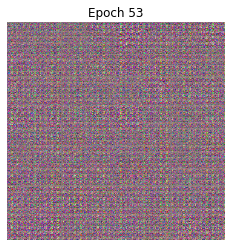

Time taken 29.415652990341187 sec



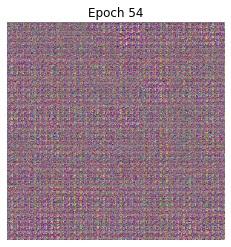

Time taken 29.351370096206665 sec



In [ ]:
wlg = [None] * W_EPOCH
wld = [None] * W_EPOCH
wsp = [None] * W_EPOCH
rsTrain = float(batch_size) / float(image_count)
ctr = 0
for ep in range(W_EPOCH):
    start = time.time()
    lgt = 0.0
    ldt = 0.0
    for c1 in dsTrain:
        lg, ld = WTrain[ctr](c1)
        ctr += 1
        lgt += lg.numpy()
        ldt += ld.numpy()
        if ctr == WCritic : ctr = 0
    wlg[ep] = lgt * rsTrain
    wld[ep] = ldt * rsTrain
    
    out = WG(s, training = False)
    img = utPuzzle(
        (out * 255.0).numpy().astype(np.uint8),
        SAMPLE_COL,
        SAMPLE_ROW,
        "test3-2/w_%04d.png" % ep
    )
    wsp[ep] = img
    #if ep % 3 == 0:
    plt.imshow(img)
    plt.axis("off")
    plt.title("Epoch %d" % ep)
    plt.show()
    print ('Time taken {} sec\n'.format(time.time() - start))

In [ ]:
utMakeGif(np.array(wsp), "test3-2/iwgan-3.gif", duration = 2)

In [ ]:
plt.plot(range(W_EPOCH), wld, color = "blue", label = "Discriminator Loss")
plt.plot(range(W_EPOCH), wlg, color = "red", label = "Generator Loss")
plt.legend(loc = "upper right")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("WGAN Training Loss")
plt.show()

#report

1.建立dataset，使用tf.data.Dataset先資料夾內所有圖片的名字存到dataset中，再用map function，
使用 load_image 進行資料預處理，建立圖片dataset。
    
2.dsTrain = dataset_list.map(load_image).shuffle(BUF).batch(batch_size, True)
將dataset shuffle 和因為演算法中的batch size 的foor loop，所以對dataset做batch化。

3.將WGAN的optimizers改成Adam根據演算法中的調整參數
opg = keras.optimizers.Adam(learning_rate=IW_LR,beta_1=0.,beta_2=0.9)
opd = keras.optimizers.Adam(learning_rate=IW_LR,beta_1=0.,beta_2=0.9)

4.在WDTrain修改loss算法和增加gradient penalty